In [1]:
# Cell 1: GPU check
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)
    print("✅ GPU Available:", gpus)
else:
    print("❌ No GPU found, running on CPU")


TensorFlow version: 2.10.1
✅ GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
import os
import matplotlib.pyplot as plt
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetV2L
from tensorflow.keras.preprocessing import image_dataset_from_directory
from sklearn.utils.class_weight import compute_class_weight
import tensorflow as tf
from PIL import Image


In [3]:
base_dir = r"C:\Users\himanshu verma\OneDrive\Pictures\garbage_classification"

img_size = (384, 384)  # EfficientNetV2-L default input size
batch_size = 32

train_ds = image_dataset_from_directory(
    base_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

val_ds = image_dataset_from_directory(
    base_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

class_names = train_ds.class_names
print("Classes:", class_names)


Found 15515 files belonging to 12 classes.
Using 12412 files for training.
Found 15515 files belonging to 12 classes.
Using 3103 files for validation.
Classes: ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']


In [4]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)


In [5]:
labels_list = []
for _, labels in train_ds.unbatch():
    labels_list.append(int(labels.numpy()))
labels_list = np.array(labels_list)

class_weights_arr = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(labels_list),
    y=labels_list
)

class_weights = {i: w for i, w in enumerate(class_weights_arr)}
print("Class Weights:", class_weights)


Class Weights: {0: 1.3645558487247142, 1: 1.3176220806794054, 2: 2.1821378340365682, 3: 1.4506778868630201, 4: 0.24308656482569527, 5: 2.0123216601815823, 6: 1.7210205213533, 7: 1.2140062597809076, 8: 1.5188448360254527, 9: 0.6521647751155948, 10: 1.8437314319667262, 11: 1.636603375527426}


In [6]:
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
])


In [7]:
base_model = EfficientNetV2L(weights="imagenet", include_top=False, input_shape=img_size + (3,))
base_model.trainable = False  # freeze base model initially

inputs = keras.Input(shape=img_size + (3,))
x = data_augmentation(inputs)
x = keras.applications.efficientnet_v2.preprocess_input(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(len(class_names), activation="softmax")(x)

model = keras.Model(inputs, outputs)

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 384, 384, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 384, 384, 3)       0         
                                                                 
 efficientnetv2-l (Functiona  (None, 12, 12, 1280)     117746848 
 l)                                                              
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 12)                15372 

In [8]:
callbacks = [
    keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3, restore_best_weights=True),
    keras.callbacks.ModelCheckpoint("best_efficientnetv2l.h5", save_best_only=True, monitor="val_accuracy")
]


In [9]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    class_weight=class_weights,
    callbacks=callbacks
)


Epoch 1/10
388/388 [==============================] - 1008s 2s/step - loss: 1.8614 - accuracy: 0.5998 - val_loss: 1.1656 - val_accuracy: 0.8746
Epoch 2/10
388/388 [==============================] - 946s 2s/step - loss: 1.0843 - accuracy: 0.8734 - val_loss: 0.7001 - val_accuracy: 0.9069
Epoch 3/10
388/388 [==============================] - 946s 2s/step - loss: 0.7800 - accuracy: 0.8954 - val_loss: 0.5181 - val_accuracy: 0.9188
Epoch 4/10
388/388 [==============================] - 947s 2s/step - loss: 0.6205 - accuracy: 0.9081 - val_loss: 0.4230 - val_accuracy: 0.9272
Epoch 5/10
388/388 [==============================] - 941s 2s/step - loss: 0.5380 - accuracy: 0.9157 - val_loss: 0.3644 - val_accuracy: 0.9317
Epoch 6/10
388/388 [==============================] - 973s 3s/step - loss: 0.4747 - accuracy: 0.9223 - val_loss: 0.3245 - val_accuracy: 0.9365
Epoch 7/10
388/388 [==============================] - 944s 2s/step - loss: 0.4298 - accuracy: 0.9281 - val_loss: 0.2952 - val_accuracy: 0.941

In [12]:
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy("mixed_float16")

# Reduce batch size for GPU
BATCH_SIZE = 8
train_ds = train_ds.unbatch().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.unbatch().batch(BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

# Partial unfreeze: last 50 layers
base_model.trainable = True
for layer in base_model.layers[:-50]:
    layer.trainable = False

# Re-compile with lower LR
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

# Fine-tune
history_finetune = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    class_weight=class_weights,
    callbacks=callbacks
)


Epoch 1/10
1552/1552 [==============================] - 871s 546ms/step - loss: 0.0890 - accuracy: 0.9778 - val_loss: 0.0872 - val_accuracy: 0.9742
Epoch 2/10
1552/1552 [==============================] - 792s 510ms/step - loss: 0.0495 - accuracy: 0.9857 - val_loss: 0.0840 - val_accuracy: 0.9762
Epoch 3/10
1552/1552 [==============================] - 790s 509ms/step - loss: 0.0319 - accuracy: 0.9894 - val_loss: 0.0902 - val_accuracy: 0.9762
Epoch 4/10
1552/1552 [==============================] - 791s 510ms/step - loss: 0.0248 - accuracy: 0.9930 - val_loss: 0.0847 - val_accuracy: 0.9797
Epoch 5/10
1552/1552 [==============================] - 784s 505ms/step - loss: 0.0216 - accuracy: 0.9929 - val_loss: 0.0838 - val_accuracy: 0.9781
Epoch 6/10
1552/1552 [==============================] - 791s 509ms/step - loss: 0.0187 - accuracy: 0.9939 - val_loss: 0.1057 - val_accuracy: 0.9749
Epoch 7/10
1552/1552 [==============================] - 794s 512ms/step - loss: 0.0141 - accuracy: 0.9951 - val_

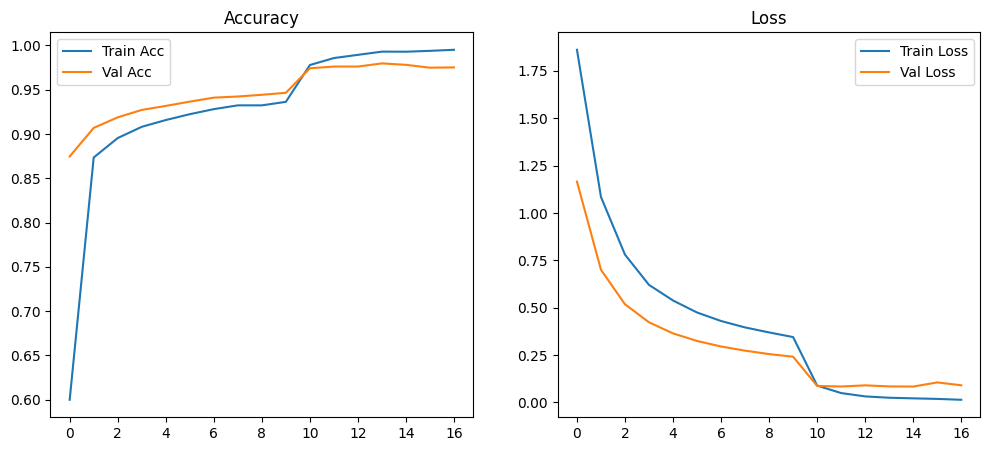

In [13]:
acc = history.history['accuracy'] + history_finetune.history['accuracy']
val_acc = history.history['val_accuracy'] + history_finetune.history['val_accuracy']
loss = history.history['loss'] + history_finetune.history['loss']
val_loss = history.history['val_loss'] + history_finetune.history['val_loss']

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(acc, label="Train Acc")
plt.plot(val_acc, label="Val Acc")
plt.legend()
plt.title("Accuracy")

plt.subplot(1,2,2)
plt.plot(loss, label="Train Loss")
plt.plot(val_loss, label="Val Loss")
plt.legend()
plt.title("Loss")
plt.show()


In [14]:
def classify_image(img_path, model=model, class_names=class_names):
    img = Image.open(img_path).convert("RGB")
    img = img.resize(img_size)
    img_array = np.array(img)
    img_array = tf.keras.applications.efficientnet_v2.preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)
    preds = model.predict(img_array)
    class_idx = np.argmax(preds[0])
    confidence = preds[0][class_idx] * 100
    print(f"Your image belongs to '{class_names[class_idx]}' category with {confidence:.2f}% confidence.")
    return class_names[class_idx], confidence


In [15]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def test_folder(folder_path, model=model, class_names=class_names, img_size=(224,224), max_images=100):
    # List all valid image files
    valid_exts = (".jpg", ".jpeg", ".png")
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_exts)]
    image_files = image_files[:max_images]  # Only first 100

    print(f"Found {len(image_files)} images in folder. Predicting first {len(image_files)}...\n")

    for i, file_name in enumerate(image_files, start=1):
        img_path = os.path.join(folder_path, file_name)
        try:
            # Predict
            label, confidence = classify_image(img_path, model, class_names)

            # Show image with prediction
            img = Image.open(img_path).convert("RGB")
            plt.imshow(img)
            plt.axis("off")
            plt.title(f"{label} ({confidence:.2f}%)")
            plt.show()

            print(f"{i}. {file_name} ➝ {label} ({confidence:.2f}%)\n")

        except Exception as e:
            print(f"⚠️ Error in {file_name}: {e}")


Found 75 images in folder. Predicting first 75...

1/1 [==============================] - 6s 6s/step
Your image belongs to 'plastic' category with 87.83% confidence.


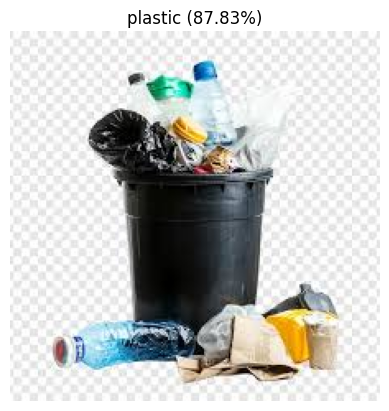

1. download (1).jpeg ➝ plastic (87.83%)

1/1 [==============================] - 0s 66ms/step
Your image belongs to 'shoes' category with 99.83% confidence.


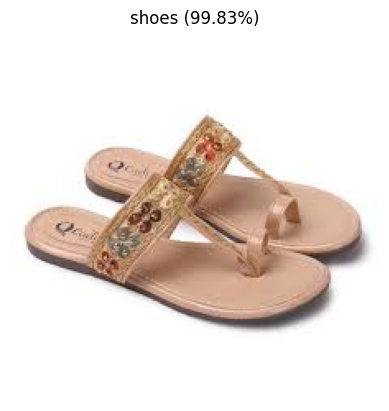

2. download (10).jpeg ➝ shoes (99.83%)

1/1 [==============================] - 0s 61ms/step
Your image belongs to 'shoes' category with 99.83% confidence.


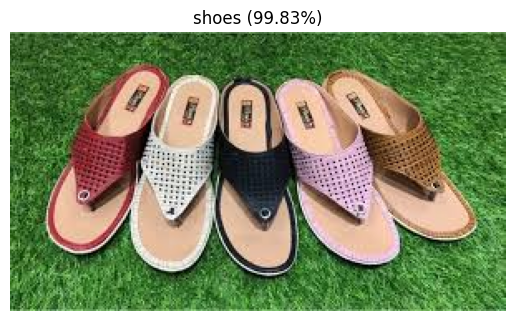

3. download (11).jpeg ➝ shoes (99.83%)

1/1 [==============================] - 0s 71ms/step
Your image belongs to 'cardboard' category with 100.00% confidence.


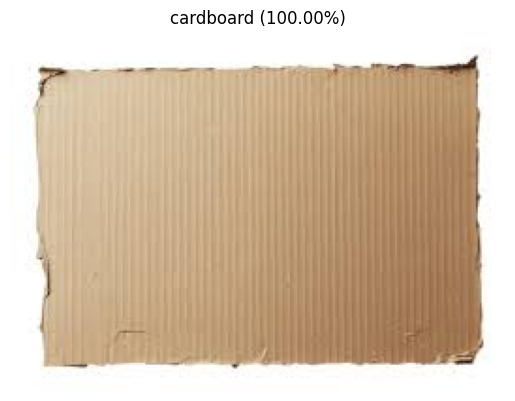

4. download (12).jpeg ➝ cardboard (100.00%)

1/1 [==============================] - 0s 68ms/step
Your image belongs to 'cardboard' category with 99.98% confidence.


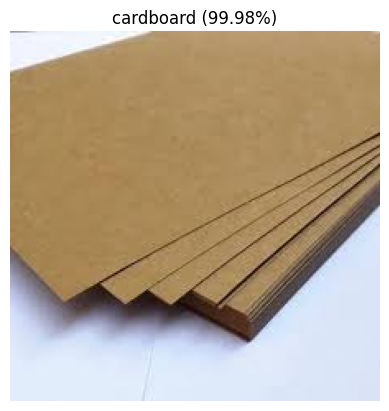

5. download (13).jpeg ➝ cardboard (99.98%)

1/1 [==============================] - 0s 61ms/step
Your image belongs to 'paper' category with 86.52% confidence.


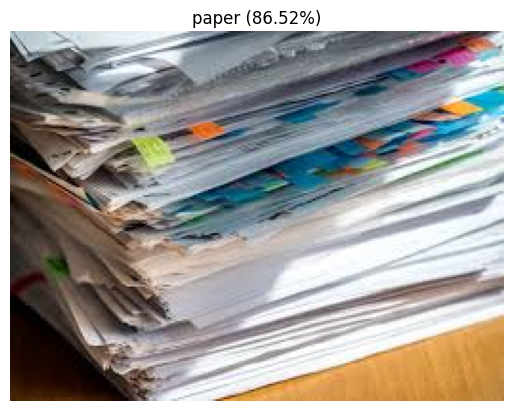

6. download (14).jpeg ➝ paper (86.52%)

1/1 [==============================] - 0s 55ms/step
Your image belongs to 'cardboard' category with 59.65% confidence.


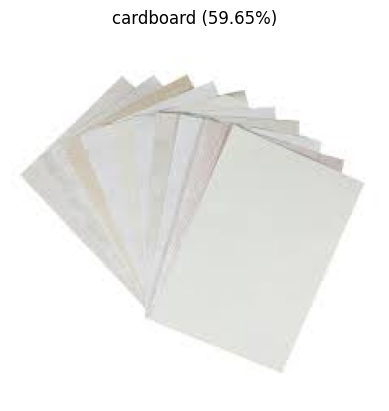

7. download (15).jpeg ➝ cardboard (59.65%)

1/1 [==============================] - 0s 69ms/step
Your image belongs to 'cardboard' category with 99.97% confidence.


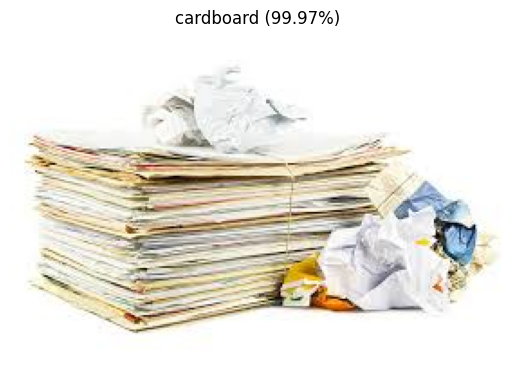

8. download (16).jpeg ➝ cardboard (99.97%)

1/1 [==============================] - 0s 77ms/step
Your image belongs to 'shoes' category with 99.96% confidence.


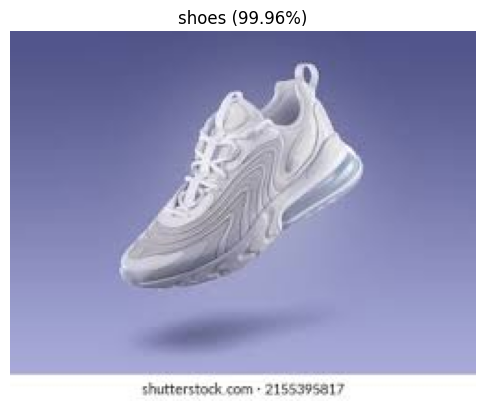

9. download (2).jpeg ➝ shoes (99.96%)

1/1 [==============================] - 0s 51ms/step
Your image belongs to 'shoes' category with 99.56% confidence.


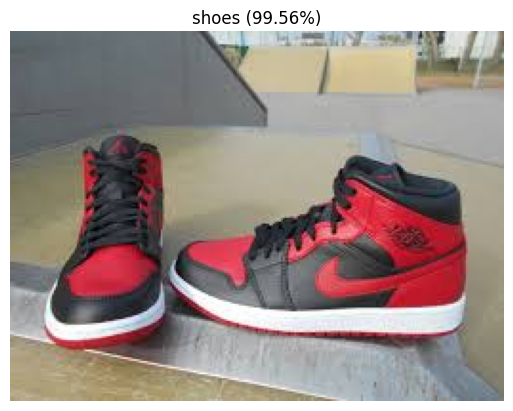

10. download (3).jpeg ➝ shoes (99.56%)

1/1 [==============================] - 0s 61ms/step
Your image belongs to 'shoes' category with 98.95% confidence.


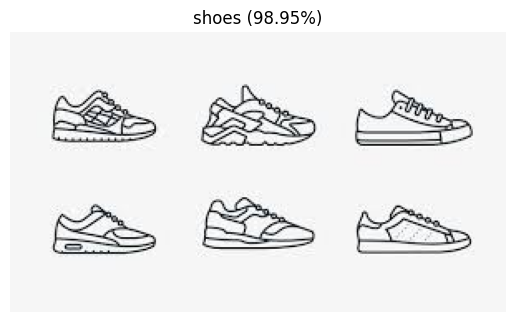

11. download (4).jpeg ➝ shoes (98.95%)

1/1 [==============================] - 0s 56ms/step
Your image belongs to 'trash' category with 53.40% confidence.


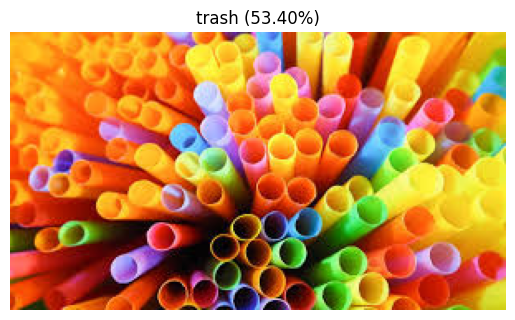

12. download (5).jpeg ➝ trash (53.40%)

1/1 [==============================] - 0s 59ms/step
Your image belongs to 'plastic' category with 100.00% confidence.


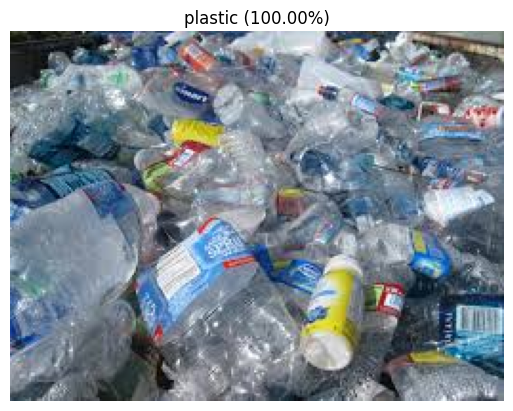

13. download (6).jpeg ➝ plastic (100.00%)

1/1 [==============================] - 0s 62ms/step
Your image belongs to 'green-glass' category with 99.92% confidence.


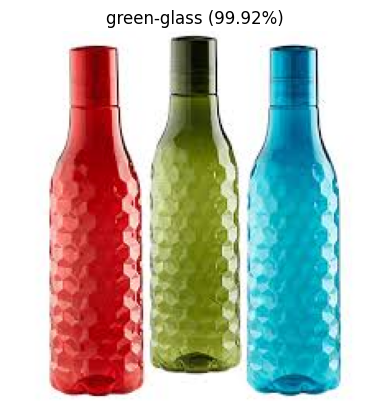

14. download (7).jpeg ➝ green-glass (99.92%)

1/1 [==============================] - 0s 68ms/step
Your image belongs to 'brown-glass' category with 100.00% confidence.


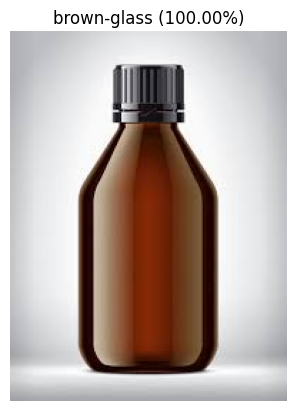

15. download (8).jpeg ➝ brown-glass (100.00%)

1/1 [==============================] - 0s 65ms/step
Your image belongs to 'shoes' category with 99.92% confidence.


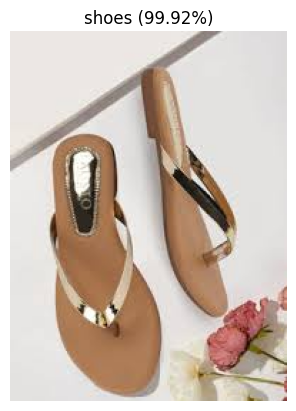

16. download (9).jpeg ➝ shoes (99.92%)

1/1 [==============================] - 0s 60ms/step
Your image belongs to 'clothes' category with 99.99% confidence.


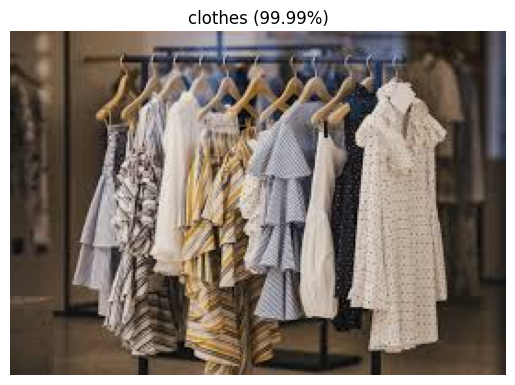

17. download.jpeg ➝ clothes (99.99%)

1/1 [==============================] - 0s 79ms/step
Your image belongs to 'metal' category with 73.72% confidence.


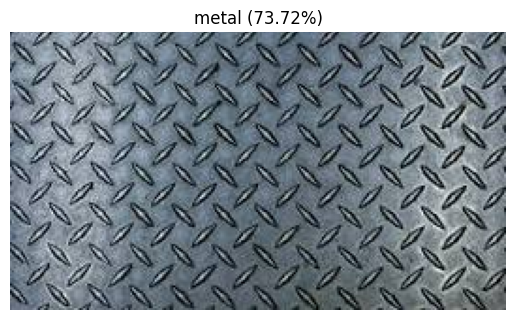

18. download.jpg ➝ metal (73.72%)

1/1 [==============================] - 0s 64ms/step
Your image belongs to 'metal' category with 94.72% confidence.


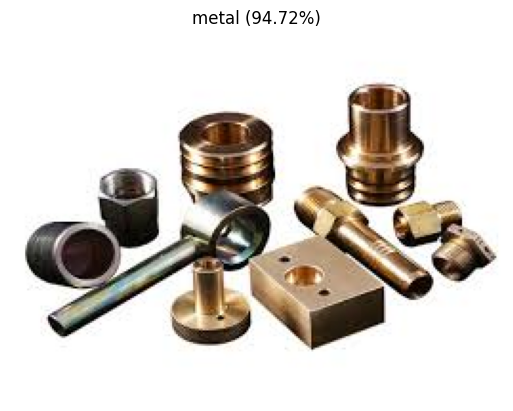

19. download1.jpeg ➝ metal (94.72%)

1/1 [==============================] - 0s 65ms/step
Your image belongs to 'biological' category with 100.00% confidence.


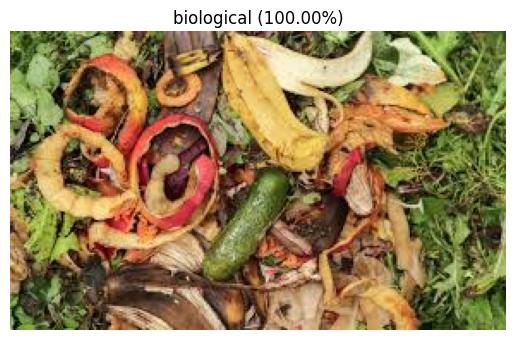

20. images (1).jpeg ➝ biological (100.00%)

1/1 [==============================] - 0s 78ms/step
Your image belongs to 'white-glass' category with 92.74% confidence.


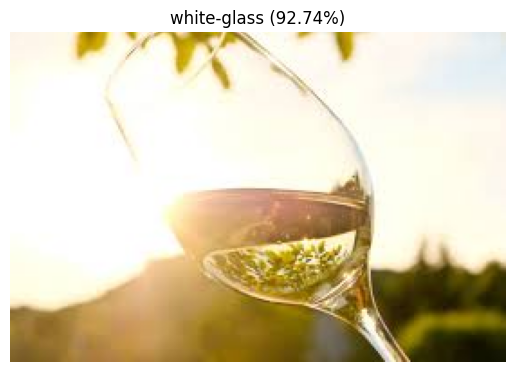

21. images (10).jpeg ➝ white-glass (92.74%)

1/1 [==============================] - 0s 63ms/step
Your image belongs to 'white-glass' category with 96.76% confidence.


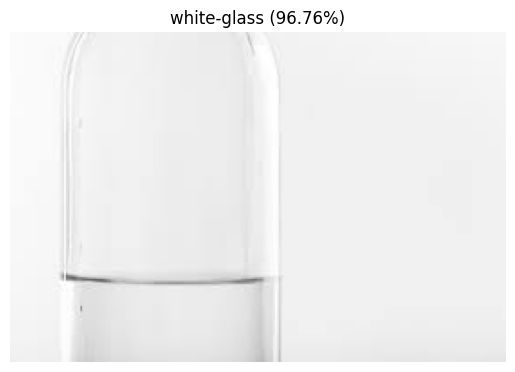

22. images (11).jpeg ➝ white-glass (96.76%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'plastic' category with 89.23% confidence.


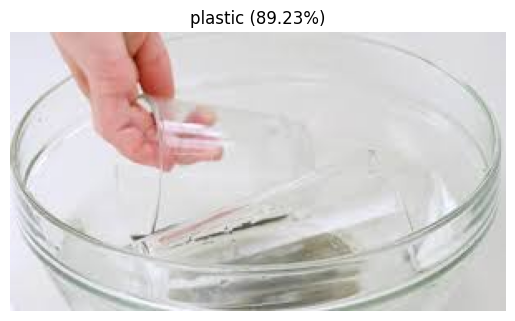

23. images (12).jpeg ➝ plastic (89.23%)

1/1 [==============================] - 0s 67ms/step
Your image belongs to 'brown-glass' category with 100.00% confidence.


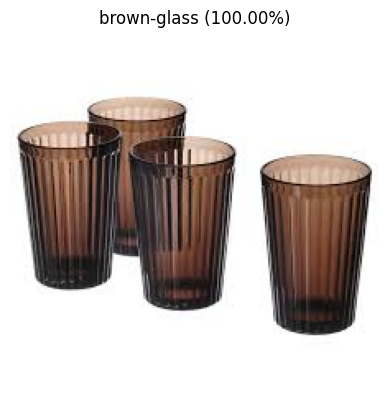

24. images (13).jpeg ➝ brown-glass (100.00%)

1/1 [==============================] - 0s 80ms/step
Your image belongs to 'brown-glass' category with 99.68% confidence.


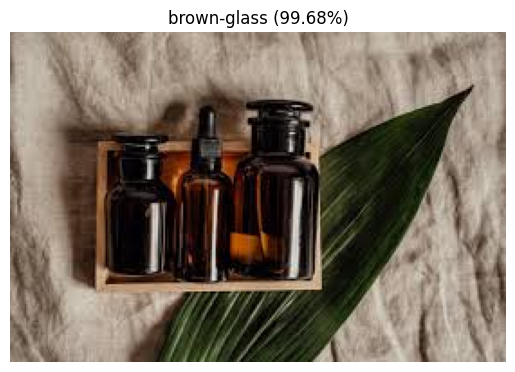

25. images (14).jpeg ➝ brown-glass (99.68%)

1/1 [==============================] - 0s 75ms/step
Your image belongs to 'brown-glass' category with 96.40% confidence.


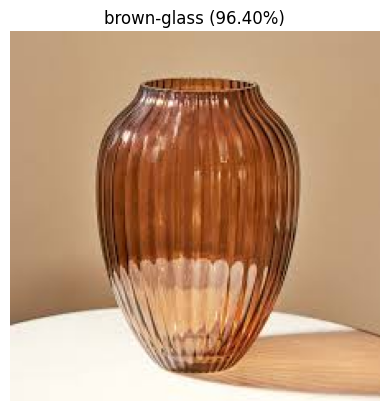

26. images (15).jpeg ➝ brown-glass (96.40%)

1/1 [==============================] - 0s 70ms/step
Your image belongs to 'green-glass' category with 98.80% confidence.


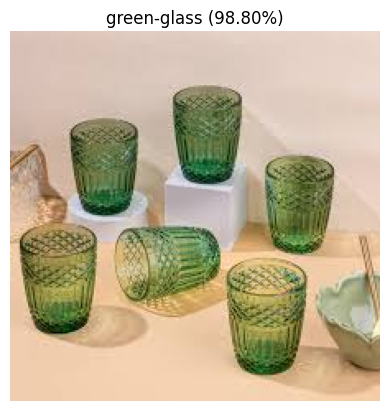

27. images (16).jpeg ➝ green-glass (98.80%)

1/1 [==============================] - 0s 82ms/step
Your image belongs to 'cardboard' category with 96.50% confidence.


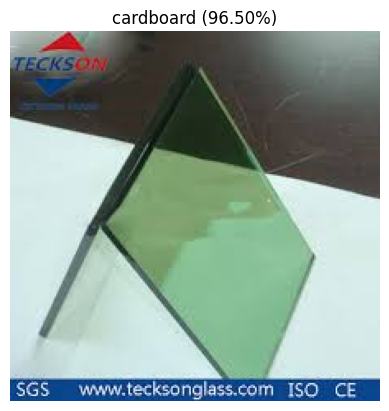

28. images (17).jpeg ➝ cardboard (96.50%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'cardboard' category with 99.60% confidence.


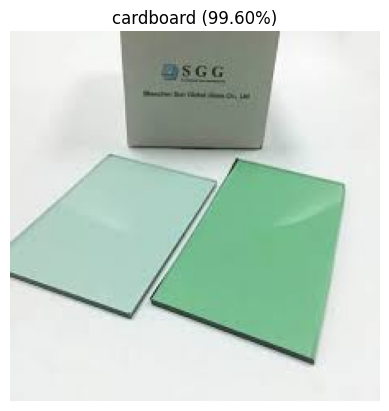

29. images (18).jpeg ➝ cardboard (99.60%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'paper' category with 56.10% confidence.


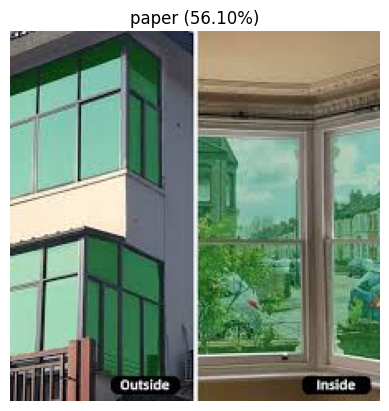

30. images (19).jpeg ➝ paper (56.10%)

1/1 [==============================] - 0s 76ms/step
Your image belongs to 'biological' category with 100.00% confidence.


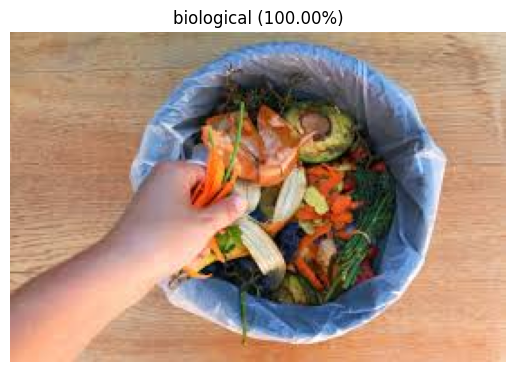

31. images (2).jpeg ➝ biological (100.00%)

1/1 [==============================] - 0s 70ms/step
Your image belongs to 'green-glass' category with 100.00% confidence.


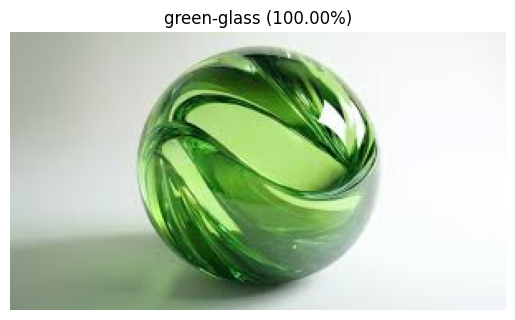

32. images (20).jpeg ➝ green-glass (100.00%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'green-glass' category with 100.00% confidence.


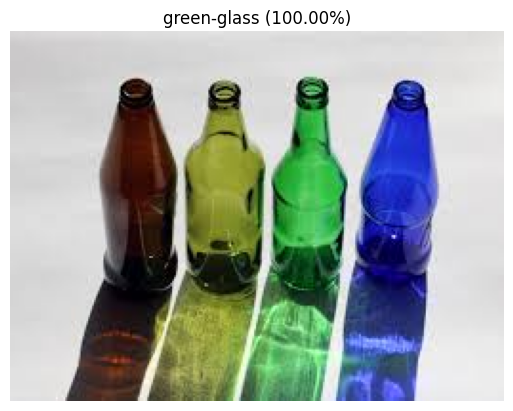

33. images (21).jpeg ➝ green-glass (100.00%)

1/1 [==============================] - 0s 83ms/step
Your image belongs to 'shoes' category with 99.37% confidence.


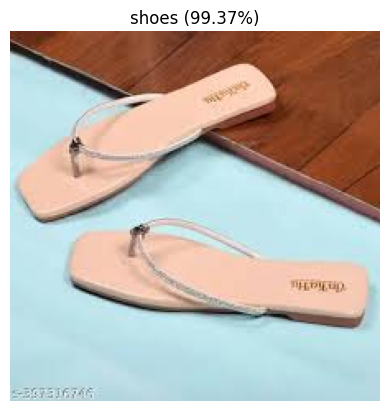

34. images (22).jpeg ➝ shoes (99.37%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'cardboard' category with 99.97% confidence.


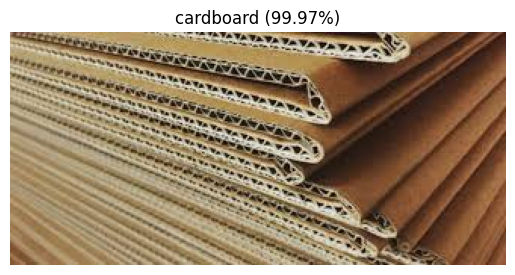

35. images (23).jpeg ➝ cardboard (99.97%)

1/1 [==============================] - 0s 90ms/step
Your image belongs to 'cardboard' category with 100.00% confidence.


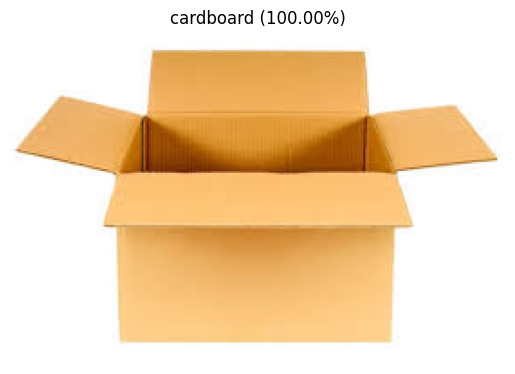

36. images (24).jpeg ➝ cardboard (100.00%)

1/1 [==============================] - 0s 70ms/step
Your image belongs to 'cardboard' category with 100.00% confidence.


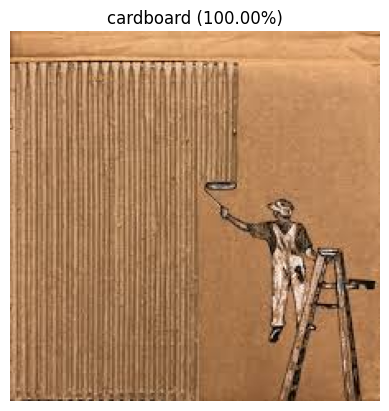

37. images (25).jpeg ➝ cardboard (100.00%)

1/1 [==============================] - 0s 71ms/step
Your image belongs to 'cardboard' category with 100.00% confidence.


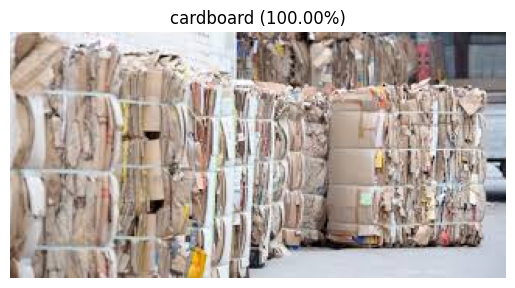

38. images (26).jpeg ➝ cardboard (100.00%)

1/1 [==============================] - 0s 71ms/step
Your image belongs to 'paper' category with 96.64% confidence.


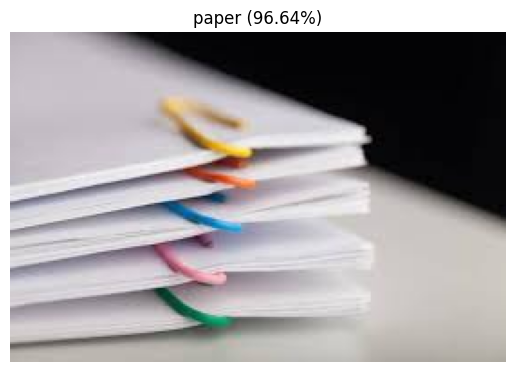

39. images (27).jpeg ➝ paper (96.64%)

1/1 [==============================] - 0s 75ms/step
Your image belongs to 'cardboard' category with 99.39% confidence.


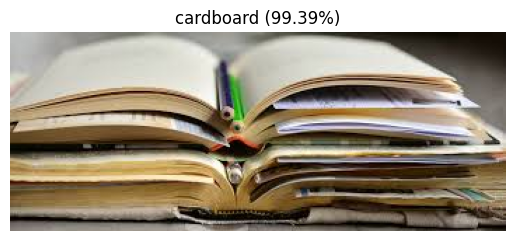

40. images (28).jpeg ➝ cardboard (99.39%)

1/1 [==============================] - 0s 74ms/step
Your image belongs to 'cardboard' category with 91.62% confidence.


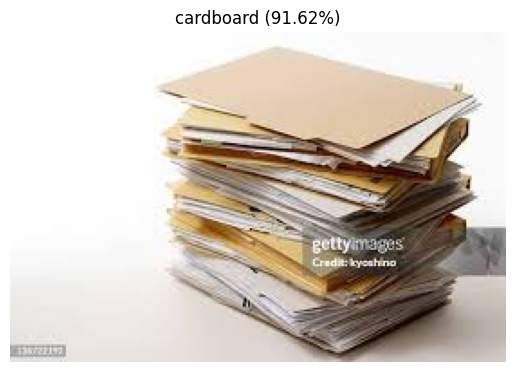

41. images (29).jpeg ➝ cardboard (91.62%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'clothes' category with 100.00% confidence.


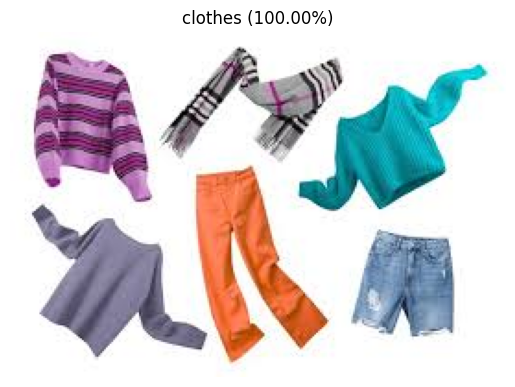

42. images (3).jpeg ➝ clothes (100.00%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'trash' category with 97.40% confidence.


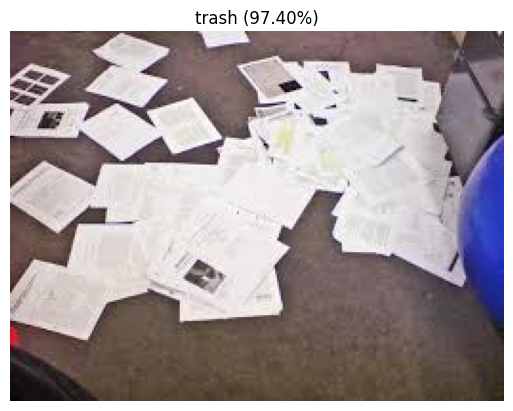

43. images (30).jpeg ➝ trash (97.40%)

1/1 [==============================] - 0s 71ms/step
Your image belongs to 'clothes' category with 99.98% confidence.


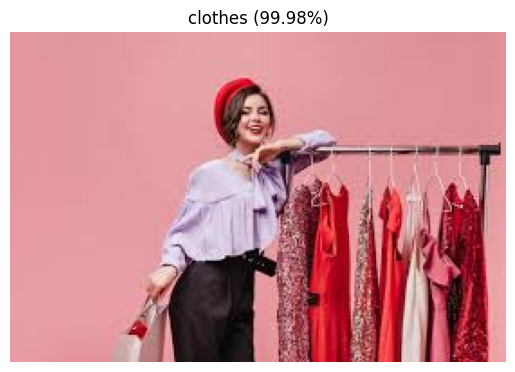

44. images (4).jpeg ➝ clothes (99.98%)

1/1 [==============================] - 0s 63ms/step
Your image belongs to 'clothes' category with 99.45% confidence.


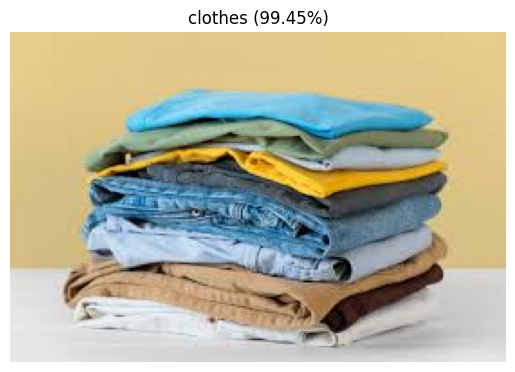

45. images (5).jpeg ➝ clothes (99.45%)

1/1 [==============================] - 0s 70ms/step
Your image belongs to 'plastic' category with 85.19% confidence.


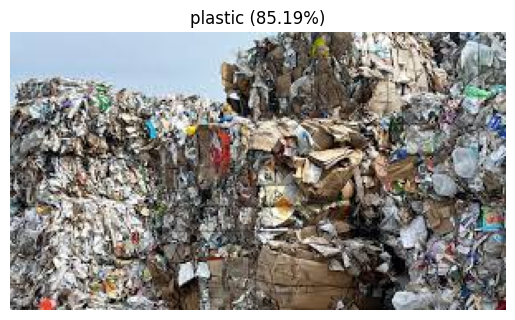

46. images (6).jpeg ➝ plastic (85.19%)

1/1 [==============================] - 0s 71ms/step
Your image belongs to 'shoes' category with 98.43% confidence.


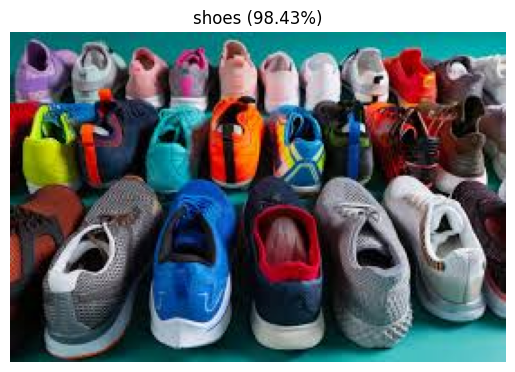

47. images (7).jpeg ➝ shoes (98.43%)

1/1 [==============================] - 0s 77ms/step
Your image belongs to 'plastic' category with 99.80% confidence.


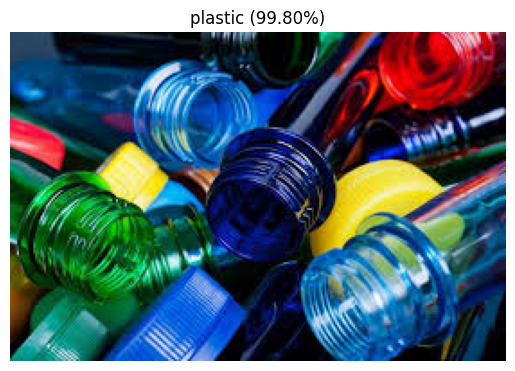

48. images (8).jpeg ➝ plastic (99.80%)

1/1 [==============================] - 0s 69ms/step
Your image belongs to 'white-glass' category with 99.97% confidence.


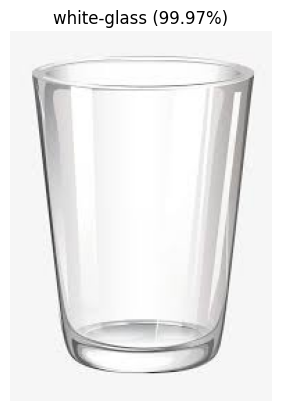

49. images (9).jpeg ➝ white-glass (99.97%)

1/1 [==============================] - 0s 67ms/step
Your image belongs to 'biological' category with 100.00% confidence.


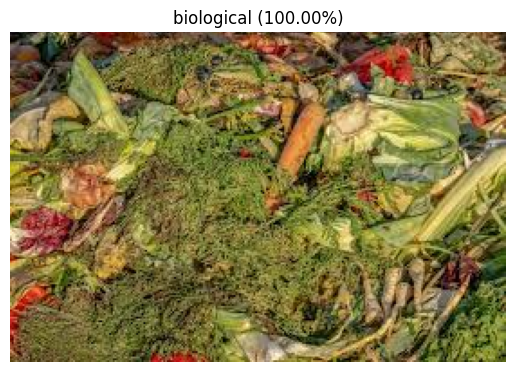

50. images.jpeg ➝ biological (100.00%)

1/1 [==============================] - 0s 68ms/step
Your image belongs to 'metal' category with 56.97% confidence.


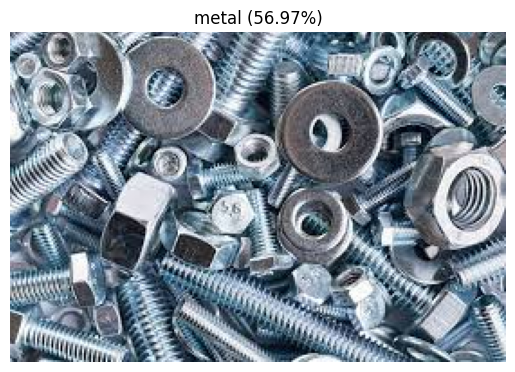

51. images.jpg ➝ metal (56.97%)

1/1 [==============================] - 0s 73ms/step
Your image belongs to 'cardboard' category with 100.00% confidence.


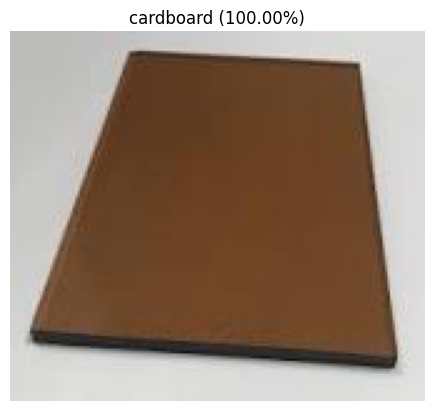

52. WhatsApp Image 2025-09-08 at 22.23.25_102210d3.jpg ➝ cardboard (100.00%)

1/1 [==============================] - 0s 82ms/step
Your image belongs to 'white-glass' category with 99.99% confidence.


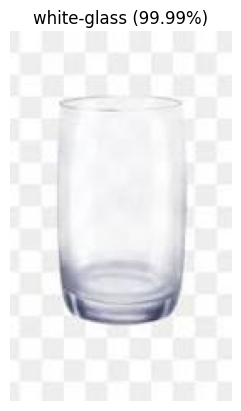

53. WhatsApp Image 2025-09-08 at 22.23.26_6b31797b.jpg ➝ white-glass (99.99%)

1/1 [==============================] - 0s 71ms/step
Your image belongs to 'battery' category with 99.96% confidence.


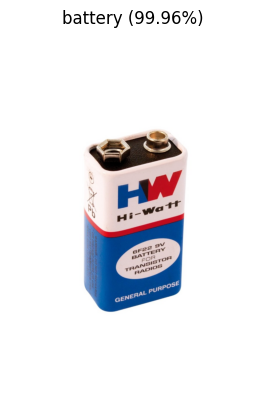

54. WhatsApp Image 2025-09-08 at 22.23.26_f277c224.jpg ➝ battery (99.96%)

1/1 [==============================] - 0s 66ms/step
Your image belongs to 'cardboard' category with 100.00% confidence.


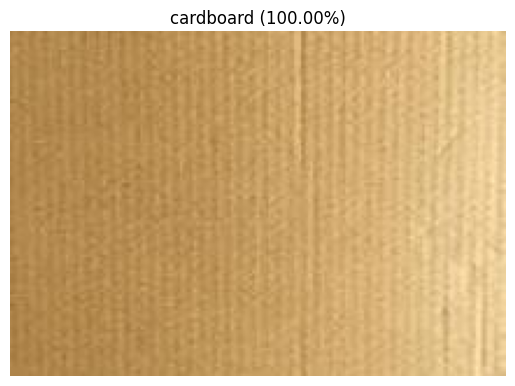

55. WhatsApp Image 2025-09-08 at 22.23.27_553d7c23.jpg ➝ cardboard (100.00%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'green-glass' category with 100.00% confidence.


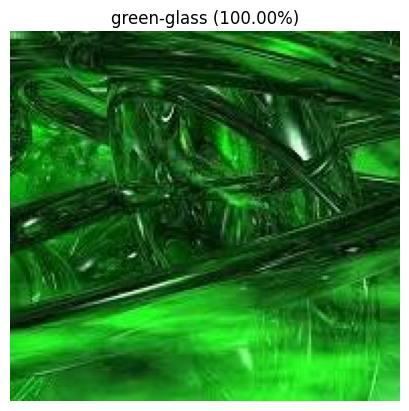

56. WhatsApp Image 2025-09-08 at 22.23.28_2d8e103c.jpg ➝ green-glass (100.00%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'white-glass' category with 98.46% confidence.


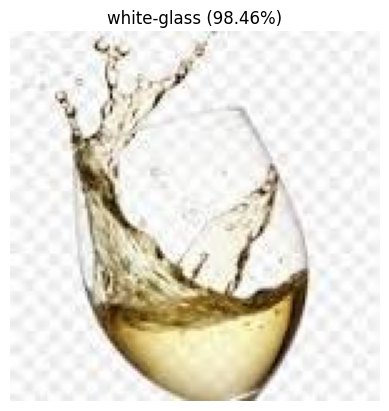

57. WhatsApp Image 2025-09-08 at 22.23.28_aa3781c4.jpg ➝ white-glass (98.46%)

1/1 [==============================] - 0s 73ms/step
Your image belongs to 'biological' category with 99.93% confidence.


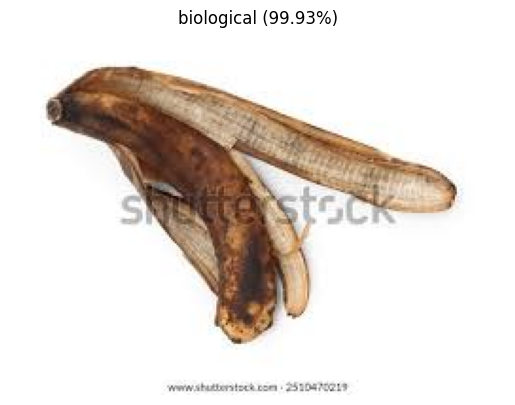

58. WhatsApp Image 2025-09-08 at 22.23.29_55d551ff.jpg ➝ biological (99.93%)

1/1 [==============================] - 0s 79ms/step
Your image belongs to 'cardboard' category with 100.00% confidence.


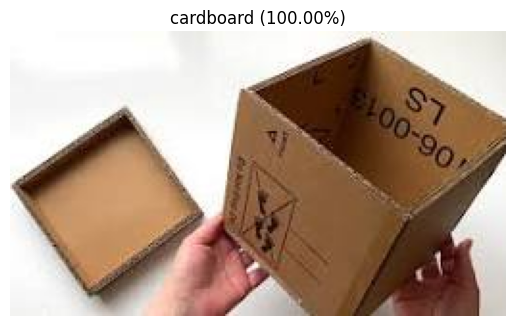

59. WhatsApp Image 2025-09-08 at 22.23.29_a70f6a81.jpg ➝ cardboard (100.00%)

1/1 [==============================] - 0s 80ms/step
Your image belongs to 'plastic' category with 94.62% confidence.


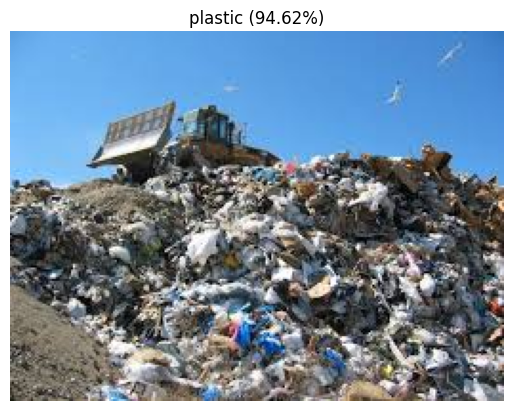

60. WhatsApp Image 2025-09-08 at 22.23.30_aa7af4a4.jpg ➝ plastic (94.62%)

1/1 [==============================] - 0s 68ms/step
Your image belongs to 'metal' category with 99.99% confidence.


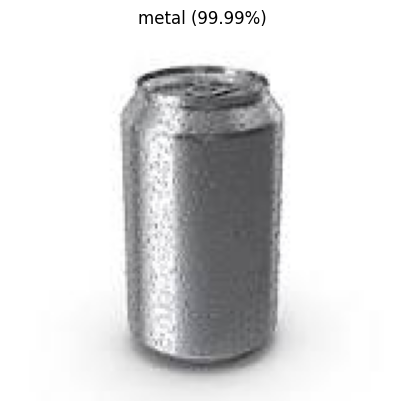

61. WhatsApp Image 2025-09-08 at 22.23.31_5593d015.jpg ➝ metal (99.99%)

1/1 [==============================] - 0s 75ms/step
Your image belongs to 'metal' category with 99.28% confidence.


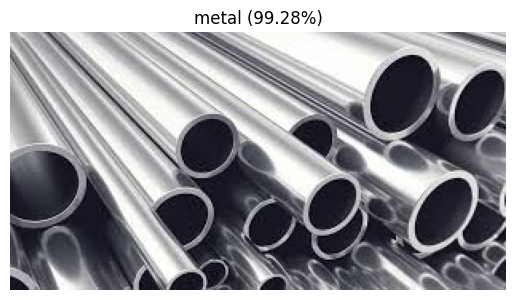

62. WhatsApp Image 2025-09-08 at 22.23.32_2c0fd679.jpg ➝ metal (99.28%)

1/1 [==============================] - 0s 66ms/step
Your image belongs to 'clothes' category with 85.77% confidence.


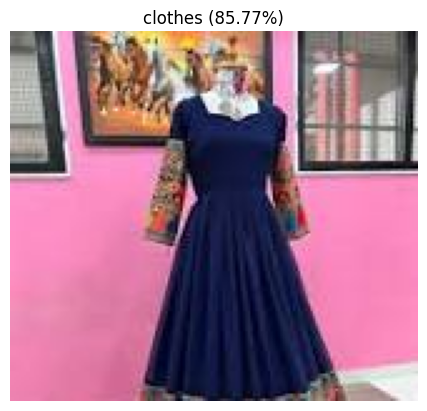

63. WhatsApp Image 2025-09-08 at 22.23.32_bc67c1b7.jpg ➝ clothes (85.77%)

1/1 [==============================] - 0s 83ms/step
Your image belongs to 'white-glass' category with 98.28% confidence.


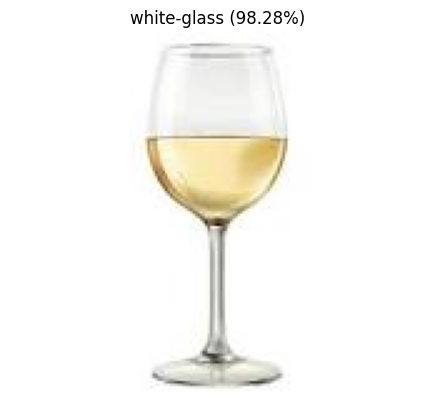

64. WhatsApp Image 2025-09-08 at 22.23.33_839a2df3.jpg ➝ white-glass (98.28%)

1/1 [==============================] - 0s 69ms/step
Your image belongs to 'battery' category with 100.00% confidence.


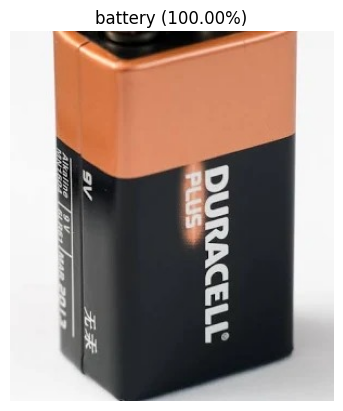

65. WhatsApp Image 2025-09-08 at 22.23.33_ca69e2f2.jpg ➝ battery (100.00%)

1/1 [==============================] - 0s 70ms/step
Your image belongs to 'clothes' category with 99.87% confidence.


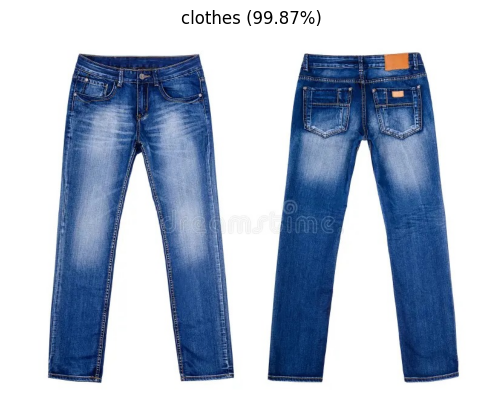

66. WhatsApp Image 2025-09-08 at 22.23.34_1d4ef8eb.jpg ➝ clothes (99.87%)

1/1 [==============================] - 0s 71ms/step
Your image belongs to 'biological' category with 100.00% confidence.


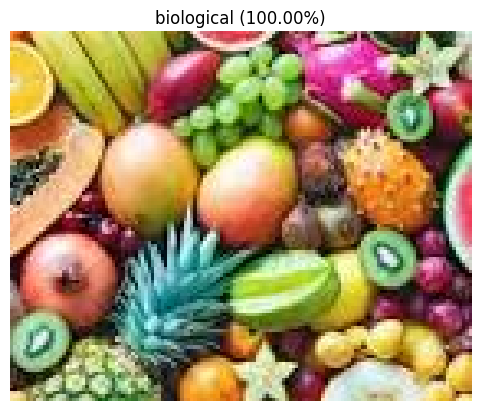

67. WhatsApp Image 2025-09-08 at 22.23.34_7f49942e.jpg ➝ biological (100.00%)

1/1 [==============================] - 0s 84ms/step
Your image belongs to 'clothes' category with 99.87% confidence.


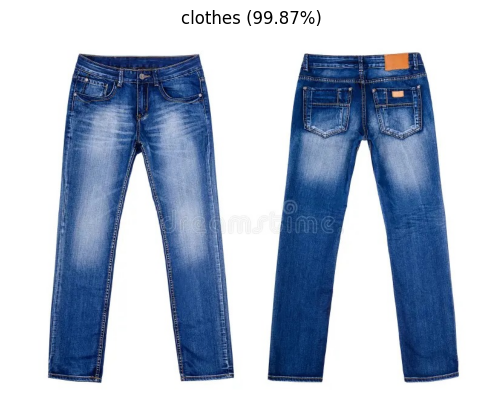

68. WhatsApp Image 2025-09-08 at 22.23.34_83554022.jpg ➝ clothes (99.87%)

1/1 [==============================] - 0s 76ms/step
Your image belongs to 'shoes' category with 99.95% confidence.


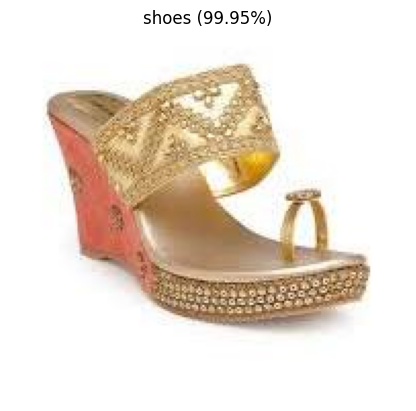

69. WhatsApp Image 2025-09-08 at 22.23.35_656ea934.jpg ➝ shoes (99.95%)

1/1 [==============================] - 0s 72ms/step
Your image belongs to 'metal' category with 54.79% confidence.


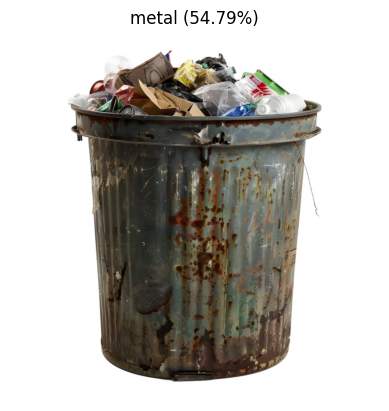

70. WhatsApp Image 2025-09-08 at 22.23.35_8021d748.jpg ➝ metal (54.79%)

1/1 [==============================] - 0s 83ms/step
Your image belongs to 'metal' category with 99.94% confidence.


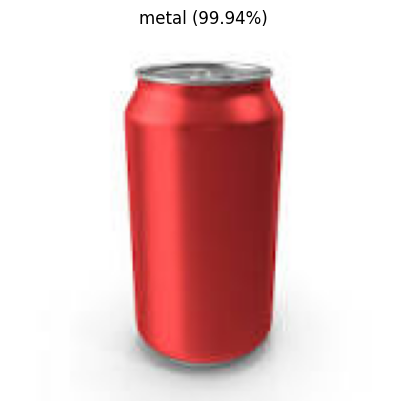

71. WhatsApp Image 2025-09-08 at 22.23.36_e2b1c3dd.jpg ➝ metal (99.94%)

1/1 [==============================] - 0s 62ms/step
Your image belongs to 'biological' category with 100.00% confidence.


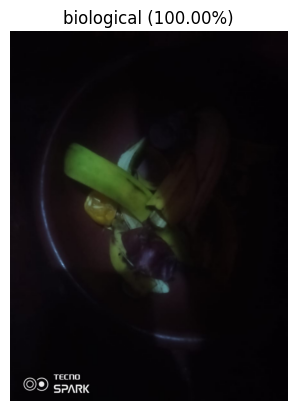

72. WhatsApp Image 2025-09-09 at 00.57.44_4272fbb0.jpg ➝ biological (100.00%)

1/1 [==============================] - 0s 82ms/step
Your image belongs to 'trash' category with 44.65% confidence.


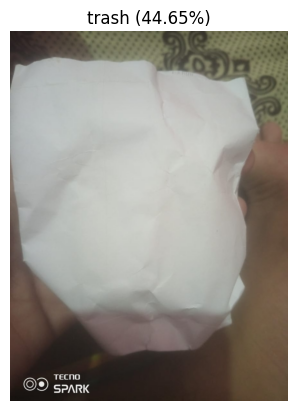

73. WhatsApp Image 2025-09-09 at 00.59.45_b1a0b8f0.jpg ➝ trash (44.65%)

1/1 [==============================] - 0s 79ms/step
Your image belongs to 'biological' category with 95.24% confidence.


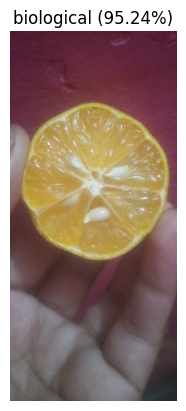

74. WhatsApp Image 2025-09-09 at 01.00.25_06720a93.jpg ➝ biological (95.24%)

1/1 [==============================] - 0s 81ms/step
Your image belongs to 'plastic' category with 99.25% confidence.


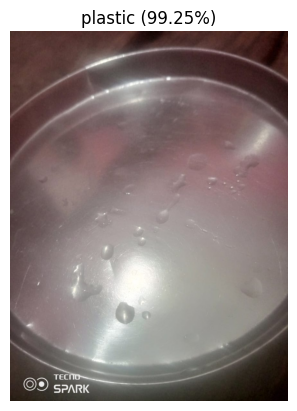

75. WhatsApp Image 2025-09-09 at 10.18.24_01874b95.jpg ➝ plastic (99.25%)



In [17]:
test_folder(r"C:\Users\himanshu verma\OneDrive\Pictures\Sample")


In [18]:
# Save as new .keras format (recommended for TF 2.10+)
model.save("Effi_WRM.keras")

# Save as HDF5 (.h5 format, for backward compatibility)
model.save("Effi_WRM.h5")

# Save in TensorFlow "SavedModel" folder format
model.save("Effi_WRM", save_format="tf")

print("✅ Model saved in .keras, .h5, and folder formats")


INFO:tensorflow:Assets written to: Effi_WRM\assets


INFO:tensorflow:Assets written to: Effi_WRM\assets


✅ Model saved in .keras, .h5, and folder formats


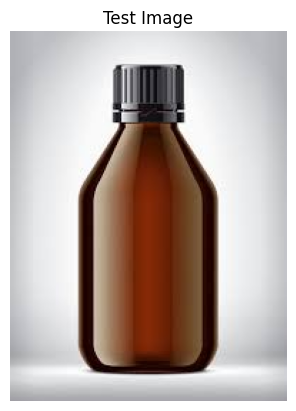


🔹 Testing .keras model


ResourceExhaustedError: {{function_node __wrapped__AddV2_device_/job:localhost/replica:0/task:0/device:GPU:0}} failed to allocate memory [Op:AddV2]

In [20]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Class names
class_names = ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes',
               'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']

# Test image path (tumhara diya hua)
test_image_path = r"C:\Users\himanshu verma\OneDrive\Pictures\Sample\download (8).jpeg"

# Helper function for prediction
def predict_image(model, img_path):
    img = tf.keras.utils.load_img(img_path, target_size=(384,384))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    
    preds = model.predict(img_array)
    class_idx = np.argmax(preds[0])
    confidence = preds[0][class_idx] * 100
    return class_names[class_idx], confidence

# Show image once
img_display = tf.keras.utils.load_img(test_image_path)
plt.imshow(img_display)
plt.axis("off")
plt.title("Test Image")
plt.show()

# --- Load and Test .keras ---
print("\n🔹 Testing .keras model")
keras_model = tf.keras.models.load_model("Effi_WRM.keras")
cls, conf = predict_image(keras_model, test_image_path)
print(f"Prediction (.keras): {cls} ({conf:.2f}%)")

# --- Load and Test .h5 ---
print("\n🔹 Testing .h5 model")
h5_model = tf.keras.models.load_model("Effi_WRM.h5")
cls, conf = predict_image(h5_model, test_image_path)
print(f"Prediction (.h5): {cls} ({conf:.2f}%)")

# --- Load and Test SavedModel folder ---
print("\n🔹 Testing SavedModel folder")
folder_model = tf.keras.models.load_model("Effi_WRM")
cls, conf = predict_image(folder_model, test_image_path)
print(f"Prediction (SavedModel folder): {cls} ({conf:.2f}%)")



In [21]:
import shutil
import os

# Source paths (jahaan abhi model save hai)
src_keras = "Effi_WRM.keras"
src_h5 = "Effi_WRM.h5"
src_folder = "Effi_WRM"

# Destination folder (tumne jo diya hai)
dst_folder = r"C:\Users\himanshu verma\OneDrive\Desktop\Effi_WRM"

# Make sure destination folder exist kare
os.makedirs(dst_folder, exist_ok=True)

# Copy .keras file
shutil.copy(src_keras, dst_folder)

# Copy .h5 file
shutil.copy(src_h5, dst_folder)

# Copy SavedModel folder
dst_model_folder = os.path.join(dst_folder, "Effi_WRM")
if os.path.exists(dst_model_folder):
    shutil.rmtree(dst_model_folder)  # agar already exist hai to delete kar do
shutil.copytree(src_folder, dst_model_folder)

print("✅ Models successfully moved to:", dst_folder)


✅ Models successfully moved to: C:\Users\himanshu verma\OneDrive\Desktop\Effi_WRM
